In [1]:
# We need to include the home directory in our path, so we can read in our own module.
import os
import sys
sys.path.append(os.path.join(".."))
import cv2
import numpy as np
from utils.imutils import jimshow
from utils.imutils import jimshow_channel
import matplotlib.pyplot as plt

## Rotation

In [2]:
image = cv2.imread("../data/img/terasse.jpeg")

__Define center__

In [3]:
(h, w) = image.shape[:2]
center = (w//2, h//2)

In [4]:
M = cv2.getRotationMatrix2D(center, 45, 1.0)# center, \theta, scale
rotated = cv2.warpAffine(image, M, (w, h))

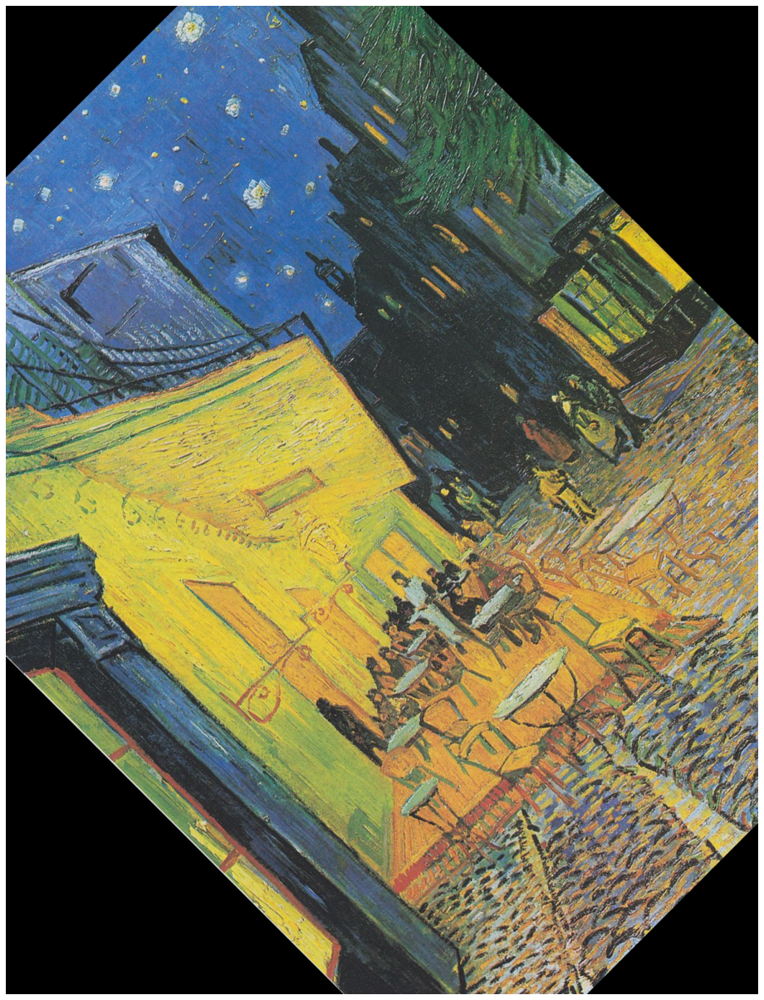

In [5]:
jimshow(rotated)

## A more useful approach?

In [6]:
def rotate(image, angle, center = None, scale = 1.0):
    # Grab the dimensions of the image
    (h, w) = image.shape[:2]

    # If the center is None, initialize it as the center of
    # the image
    if center is None:
        center = (w // 2, h // 2)

    # Perform the rotation
    M = cv2.getRotationMatrix2D(center, angle, scale)
    rotated = cv2.warpAffine(image, M, (w, h))

    # Return the rotated image
    return rotated

__Plot using jimshow__

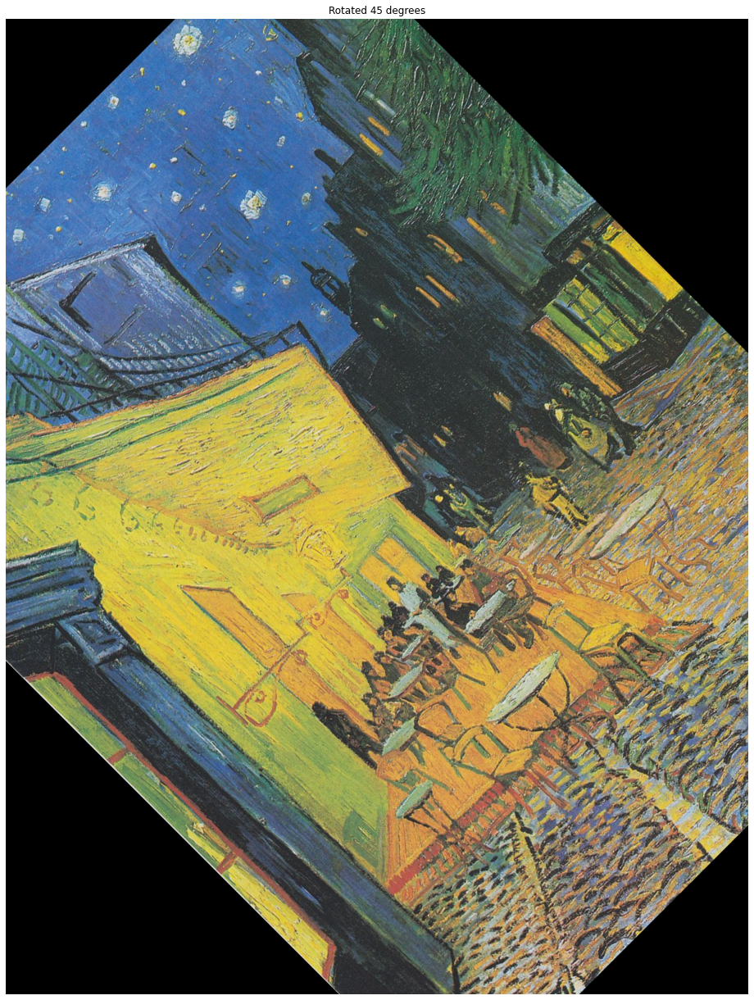

In [7]:
jimshow(rotate(image, 45), "Rotated 45 degrees")

## Splitting channels

In [8]:
(B, G, R) = cv2.split(image)

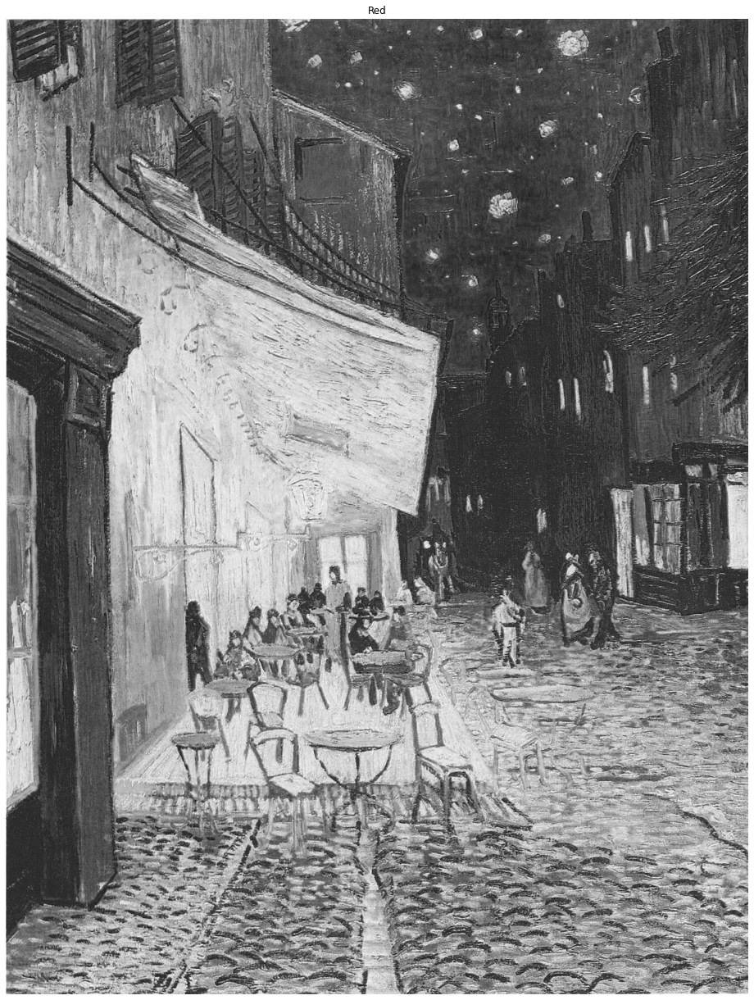

In [9]:
jimshow_channel(R, "Red")

__Empty numpy array__

In [10]:
zeros = np.zeros(image.shape[:2], dtype = "uint8")

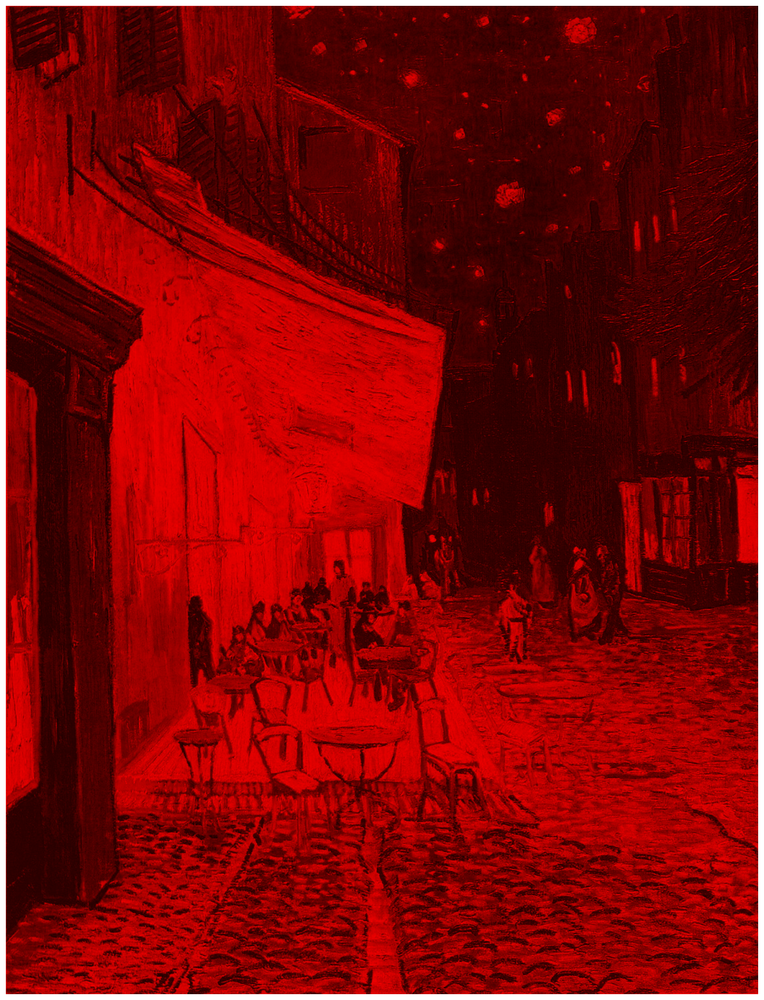

In [11]:
jimshow(cv2.merge([zeros, zeros, R]))

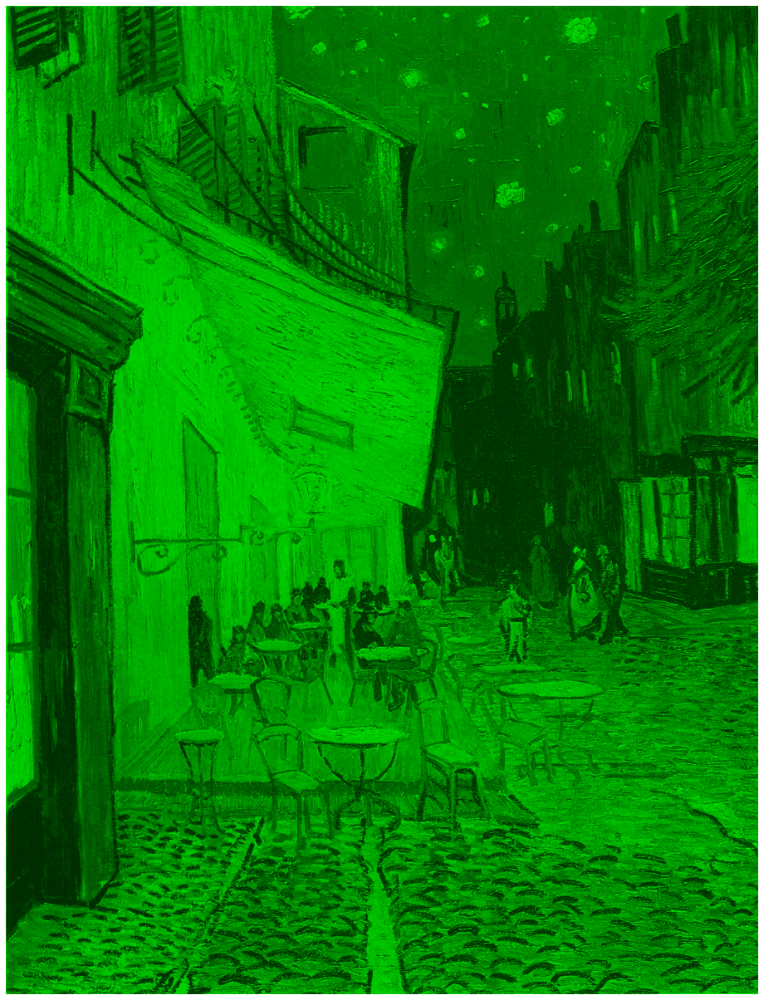

In [12]:
jimshow(cv2.merge([zeros, G, zeros]))

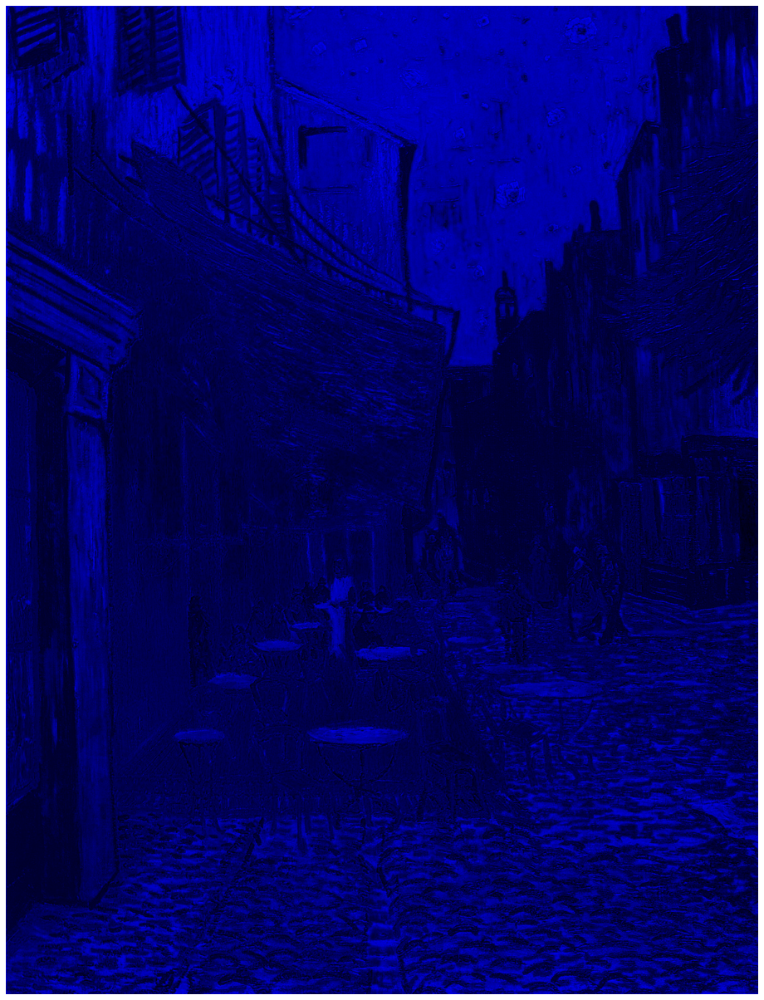

In [13]:
jimshow(cv2.merge([B, zeros, zeros]))

## Histograms

Explain this function!

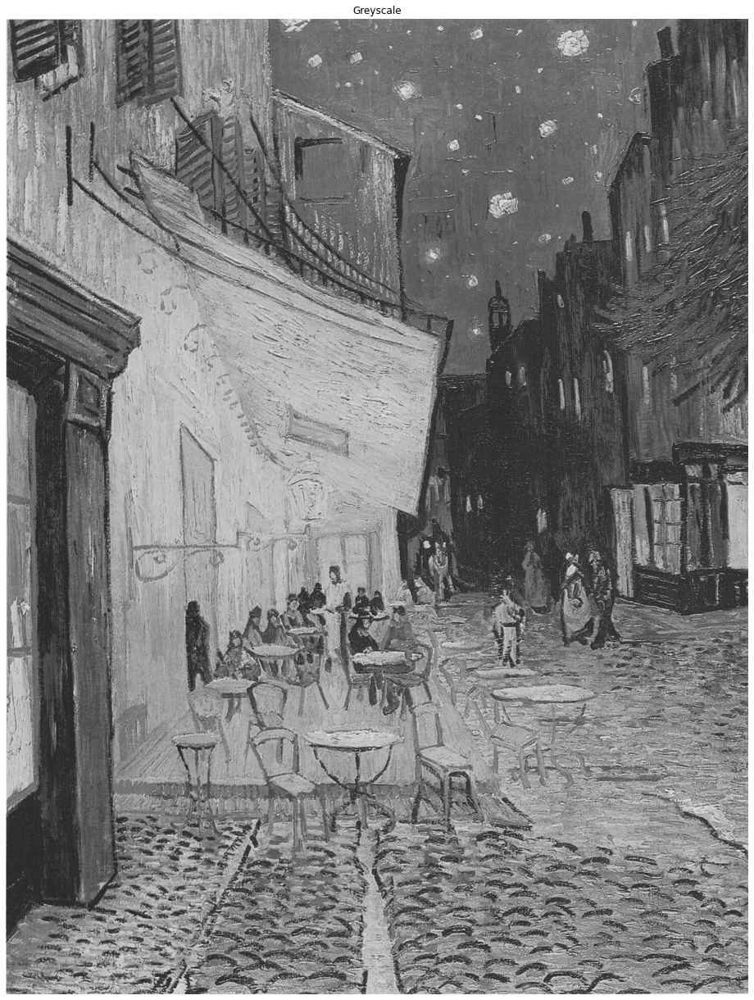

In [14]:
jimshow_channel(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), "Greyscale")

## A comment on ```COLOR_BRG2GRAY```

In [15]:
greyed_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

```greyed_image.flatten() != image.flatten()```

## A quick greyscale histogram using greyscale

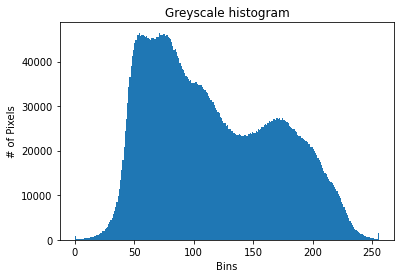

In [39]:
# Create figure
plt.figure()
# Add histogram
plt.hist(image.flatten(),256,[0,256])
# Plot title
plt.title("Greyscale histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
plt.show()

## Plotting color histograms

https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_histogram_begins/py_histogram_begins.html

```cv2.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])```

- images : it is the source image of type uint8 or float32 represented as “[img]”.
- channels : it is the index of channel for which we calculate histogram. For grayscale image, its value is [0] and
- color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
- mask : mask image. To find histogram of full image, it is given as “None”.
- histSize : this represents our BIN count. For full scale, we pass [256].
- ranges : this is our RANGE. Normally, it is [0,256].

In [20]:
def plot_histogram(image, title, mask=None):
    # split channels
    channels = cv2.split(image)
    # names of colours
    colors = ("b", "g", "r")
    # create plot
    plt.figure()
    # add title
    plt.title(title)
    # Add xlabel
    plt.xlabel("Bins")
    # Add ylabel
    plt.ylabel("# of Pixels")

    # for every tuple of channel, colour
    for (channel, color) in zip(channels, colors):
        # Create a histogram
        hist = cv2.calcHist([channel], [0], mask, [256], [0, 256])
        # Plot histogram
        plt.plot(hist, color=color)
        # Set limits of x-axis
        plt.xlim([0, 256])

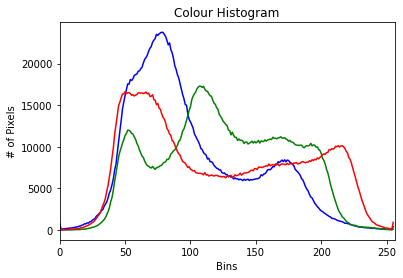

In [41]:
plot_histogram(image, "Colour Histogram")